# EDA - Exploratory Data Analysis

# importing data

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import pickle

In [2]:
dataframes = {}
pickle_dir = "../pickles"

# List or set of DataFrame names you want to exclude (minus the .pkl extension)
excluded = {"df_games_odds", "player_performance", "player_game_team_mapping", "team_performance", "df_games"}

for filename in os.listdir(pickle_dir):
    if filename.endswith(".pkl"):
        df_name = filename.replace(".pkl", "")
        
        # Skip if df_name is in the excluded set
        if df_name in excluded:
            print(f"Skipping {df_name}...")
            continue
        
        file_path = os.path.join(pickle_dir, filename)
        dataframes[df_name] = pd.read_pickle(file_path)
        print(f"Loaded {df_name} from {file_path}")

Loaded df_appearances from ../pickles/df_appearances.pkl
Skipping player_performance...
Skipping player_game_team_mapping...
Loaded dev from ../pickles/dev.pkl
Skipping df_games_odds...
Loaded df_teamstats from ../pickles/df_teamstats.pkl
Loaded df_shots from ../pickles/df_shots.pkl
Loaded gameresult from ../pickles/gameresult.pkl
Loaded df_after_feature_engineering from ../pickles/df_after_feature_engineering.pkl
Loaded df_after_outliers_missing from ../pickles/df_after_outliers_missing.pkl
Skipping team_performance...
Loaded df_with_categories from ../pickles/df_with_categories.pkl
Loaded df_num_after_EDA from ../pickles/df_num_after_EDA.pkl
Skipping df_games...
Loaded manipulated_data_no_outleirs from ../pickles/manipulated_data_no_outleirs.pkl
Loaded df_model from ../pickles/df_model.pkl
Loaded player_shots from ../pickles/player_shots.pkl
Loaded df_after_EDA from ../pickles/df_after_EDA.pkl
Loaded test from ../pickles/test.pkl
Loaded teamstats from ../pickles/teamstats.pkl
Loaded 

In [3]:
for key, df in dataframes.items():
    globals()[key] = df


# descriptive statistics

In [4]:
# AV = AutoViz_Class()
# %matplotlib inline
# dfte = AV.AutoViz('../csvs/teamstats.csv', sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
#                   chart_format='svg', max_rows_analyzed=15000, max_cols_analyzed=50, save_plot_dir=None)


In [5]:
# from autoviz.AutoViz_Class import AutoViz_Class

# AV = AutoViz_Class()
# %matplotlib inline

# # First DataFrame
# #teamstats.to_csv("teamstats.csv", index=False)
# AV.AutoViz(r'../csvs/teamstats.csv')

In [6]:
teamstats

,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,...,away_total_assists,away_total_xAssists,away_total_key_passes,away_total_xGoalsChain,away_total_xGoalsBuildup,away_total_yellow_cards,away_total_red_cards,away_total_blocked_shots,away_total_saved_shots,gameresult
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,1,0,...,0,0.586365,7,1.745371,0.811549,3,0,3.0,4.0,H
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0,0,...,1,0.560695,4,1.238205,0.736815,4,0,2.0,2.0,A
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0,1,...,1,0.418385,8,1.959323,1.030588,2,0,3.0,3.0,D
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,3,0,...,2,1.288886,9,7.622863,5.617276,4,0,2.0,3.0,H
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0,1,...,3,2.050685,10,10.799517,8.554974,0,0,2.0,4.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12675,16131,5,2020,2021-05-23 19:00:00,168,166,1,2,1,1,...,1,0.307960,4,1.223212,0.715843,2,0,1.0,3.0,A
12676,16132,5,2020,2021-05-23 19:00:00,177,176,1,2,1,1,...,1,0.775388,7,2.610665,1.758012,1,0,4.0,3.0,A
12677,16133,5,2020,2021-05-23 19:00:00,163,235,2,0,1,0,...,0,0.216965,6,0.884652,0.544502,0,0,0.0,2.0,H
12678,16134,5,2020,2021-05-23 19:00:00,175,181,0,1,0,1,...,1,0.565077,6,1.256511,0.764512,0,0,1.0,1.0,A


In [7]:
teamstats.to_csv("../csvs/teamstats.csv", index=False)

In [8]:
!pip install Autoviz

Defaulting to user installation because normal site-packages is not writeable


In [11]:
# import matplotlib as mpl

# # Lower the DPI (dots per inch) so the figure is "physically" smaller
# mpl.rcParams['figure.dpi'] = 50

# # Adjust the default figure size (width, height) in inches
# mpl.rcParams['figure.figsize'] = (50, 30)

# # Optionally ensure tight layouts
# mpl.rcParams['figure.autolayout'] = True

# from autoviz.AutoViz_Class import AutoViz_Class

# AV = AutoViz_Class()
# dfte = AV.AutoViz(
#     filename="../csvs/teamstats.csv",
#     sep=",",
#     depVar="",
#     chart_format="png",
#     #save_plot_dir="autoviz_plots"
# )


import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from autoviz.AutoViz_Class import AutoViz_Class

# Lower the DPI so the figure is "physically" smaller
mpl.rcParams['figure.dpi'] = 50

# Adjust the default figure size (width, height) in inches
mpl.rcParams['figure.figsize'] = (50, 30)

# Ensure tight layouts
mpl.rcParams['figure.autolayout'] = True

# Create AutoViz instance
AV = AutoViz_Class()

# Run AutoViz (this will generate and display plots)
dfte = AV.AutoViz(
    filename="../csvs/teamstats.csv",
    sep=",",
    depVar="",
    chart_format="png"
)

# Save all open figures into a single PDF
with PdfPages("autoviz_output.pdf") as pdf:
    figs = [plt.figure(n) for n in plt.get_fignums()]
    for fig in figs:
        pdf.savefig(fig)
        plt.close(fig)  # Close after saving to avoid showing again


Shape of your Data Set loaded: (12680, 47)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  16
    Number of Integer-Categorical Columns =  27
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number of Date Time Columns =  1
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    47 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['gameID']
16 numeric variables in data exceeds limit, taking top

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,100,81.000000,16135.000000,Possible ID column: drop before modeling step.
leagueID,int64,0.000000,0,1.000000,5.000000,No issue
season,int64,0.000000,0,2014.000000,2020.000000,Possible date-time colum: transform before modeling step.
date,object,0.000000,53,,,No issue
homeTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
awayTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
homeGoals,int64,0.000000,0,0.000000,10.000000,Column has 981 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
awayGoals,int64,0.000000,0,0.000000,9.000000,Column has 44 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
homeGoalsHalfTime,int64,0.000000,0,0.000000,6.000000,Column has 403 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
awayGoalsHalfTime,int64,0.000000,0,0.000000,5.000000,Column has 225 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.


Number of All Scatter Plots = 136


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package movie_reviews is a

Could not draw wordcloud plot for date
All Plots done
Time to run AutoViz = 138 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [3]:
from IPython.display import HTML

HTML('<a href="../pdf/autoviz_output.pdf" target="_blank">📄 Click here to view the full report (PDF)</a>')

In [10]:
# This restores ALL rcParams to Matplotlib's defaults
mpl.rcParams.update(mpl.rcParamsDefault)

=== Running AutoViz on df_appearances ===
    max_rows_analyzed is smaller than dataset shape 356513...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  9
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  5
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    18 Predictors classified...
        No variable

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,8,81.000000,16135.000000,No issue
playerID,int64,0.000000,4,1.000000,9567.000000,Column has 3 outliers greater than upper bound (9547.50) or lower than lower bound(-4192.50). Cap them or remove them.
goals,int64,0.000000,0,0.000000,5.000000,Column has 12763 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
ownGoals,int64,0.000000,0,0.000000,2.000000,Column has 415 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
shots,int64,0.000000,0,0.000000,14.000000,Column has 15692 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
xGoals,float64,0.000000,NA,0.000000,3.271321,Column has 19761 outliers greater than upper bound (0.19) or lower than lower bound(-0.12). Cap them or remove them.
xGoalsChain,float64,0.000000,NA,0.000000,5.052705,Column has 9034 outliers greater than upper bound (0.90) or lower than lower bound(-0.51). Cap them or remove them.
xGoalsBuildup,float64,0.000000,NA,0.000000,3.465713,Column has 18971 outliers greater than upper bound (0.41) or lower than lower bound(-0.25). Cap them or remove them.
assists,int64,0.000000,0,0.000000,4.000000,Column has 9165 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
keyPasses,int64,0.000000,0,0.000000,11.000000,Column has 9392 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.


Number of All Scatter Plots = 10


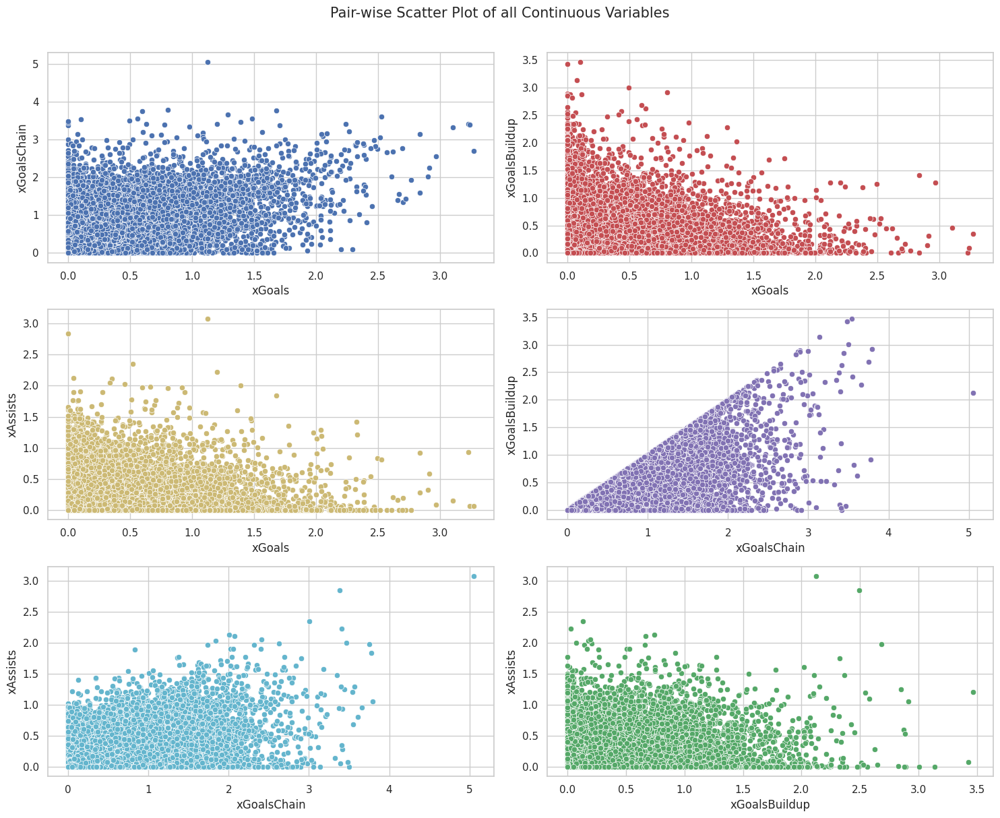

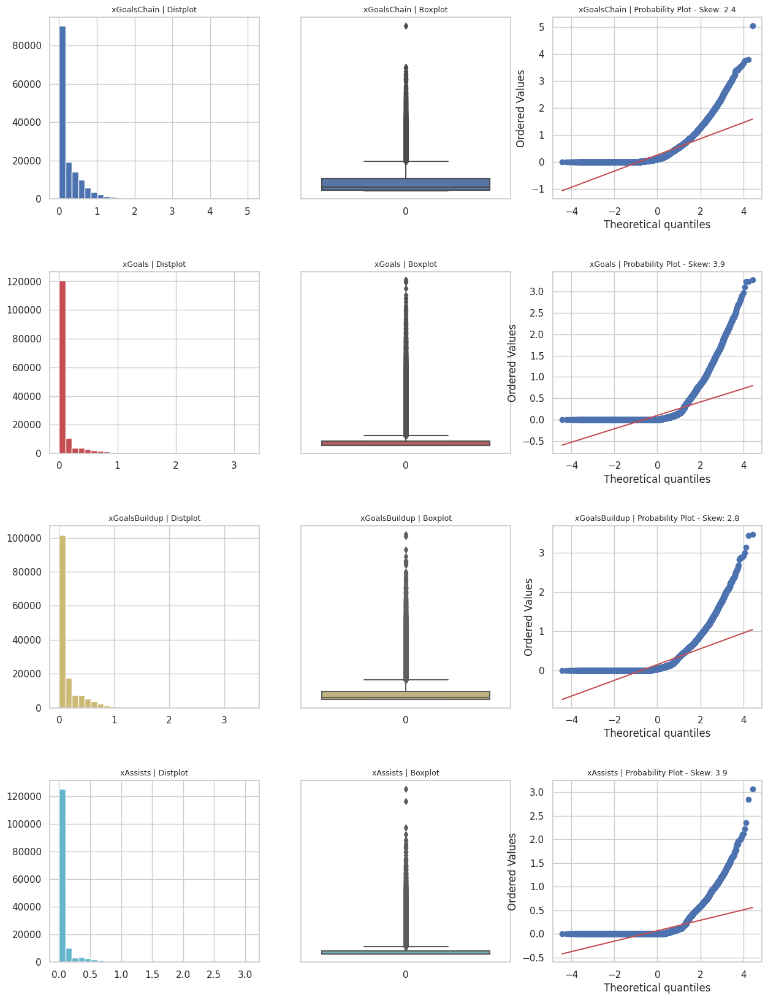

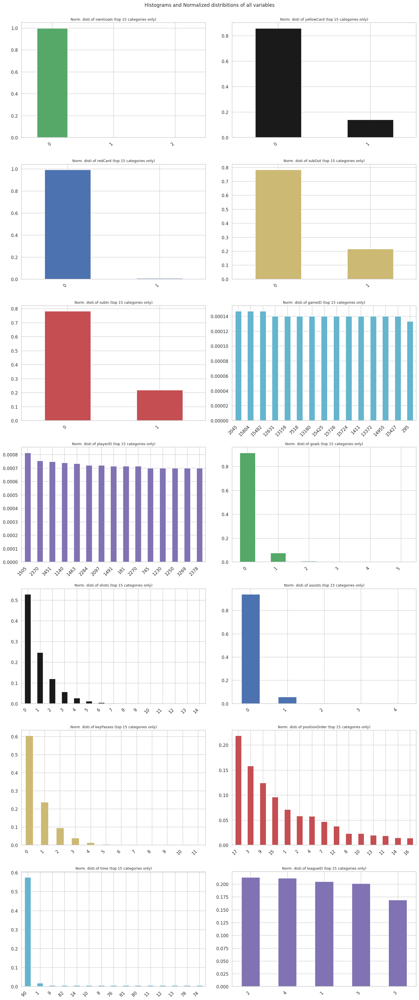

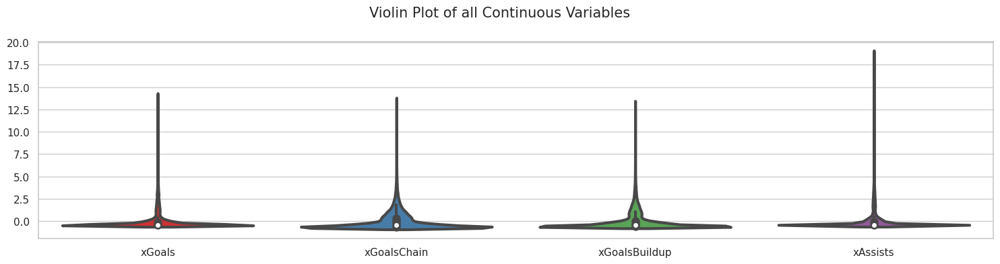

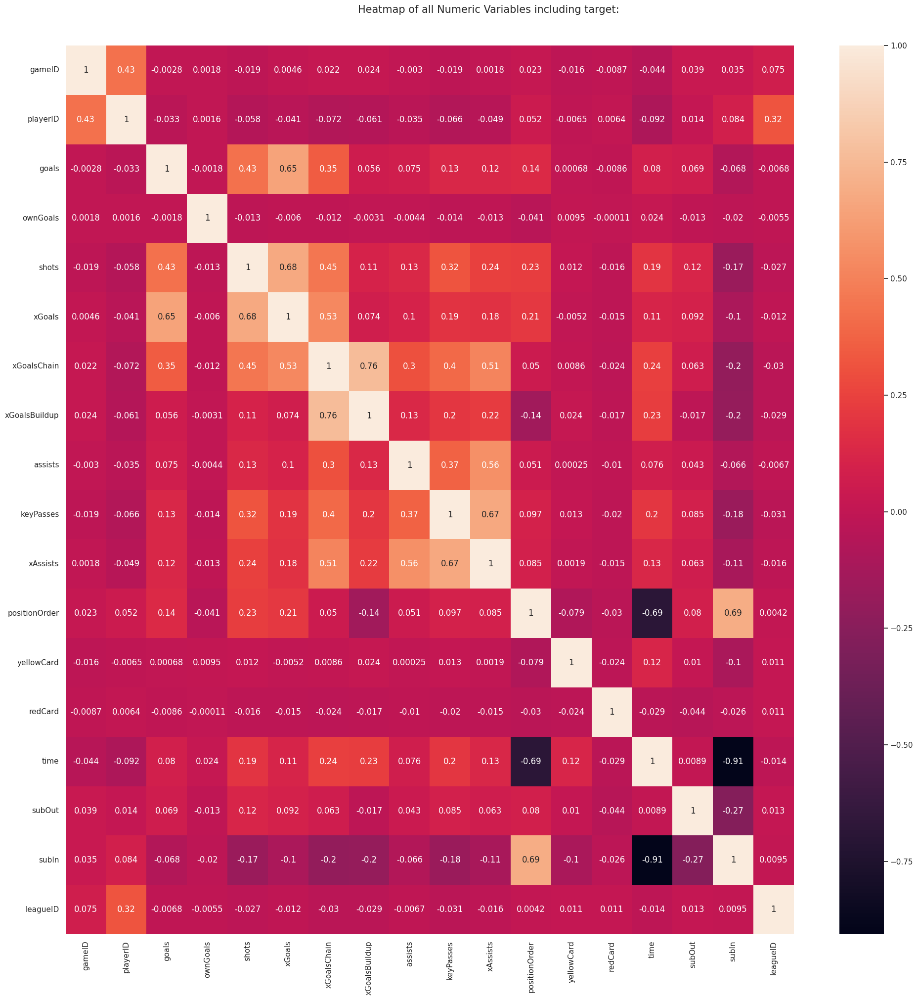

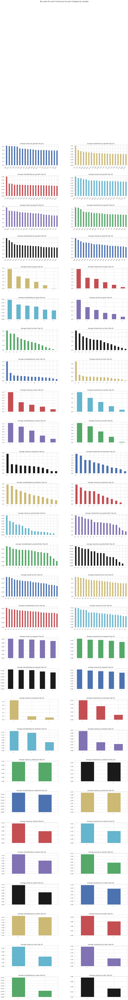

All Plots done
Time to run AutoViz = 23 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
=== Completed AutoViz on df_appearances ===

=== Running AutoViz on df_teamstats ===
Shape of your Data Set loaded: (25360, 16)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  9
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number of Date Time Columns =  1
    Number of ID Columns =  0
    Number of Columns to Delete =  0

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,50,81.000000,16135.000000,No issue
teamID,int64,0.000000,0,71.000000,262.000000,Column has 110 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
season,int64,0.000000,0,2014.000000,2020.000000,Possible date-time colum: transform before modeling step.
date,object,0.000000,26,,,No issue
location,object,0.000000,0,,,No issue
goals,int64,0.000000,0,0.000000,10.000000,Column has 156 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
xGoals,float64,0.000000,NA,0.000000,6.630490,Column has 556 outliers greater than upper bound (3.48) or lower than lower bound(-0.97). Cap them or remove them.
shots,int64,0.000000,0,0.000000,47.000000,Column has 263 outliers greater than upper bound (26.50) or lower than lower bound(-1.50). Cap them or remove them.
shotsOnTarget,int64,0.000000,0,0.000000,18.000000,Column has 469 outliers greater than upper bound (10.50) or lower than lower bound(-1.50). Cap them or remove them.
deep,int64,0.000000,0,0.000000,42.000000,Column has 722 outliers greater than upper bound (15.50) or lower than lower bound(-4.50). Cap them or remove them.


Number of All Scatter Plots = 6


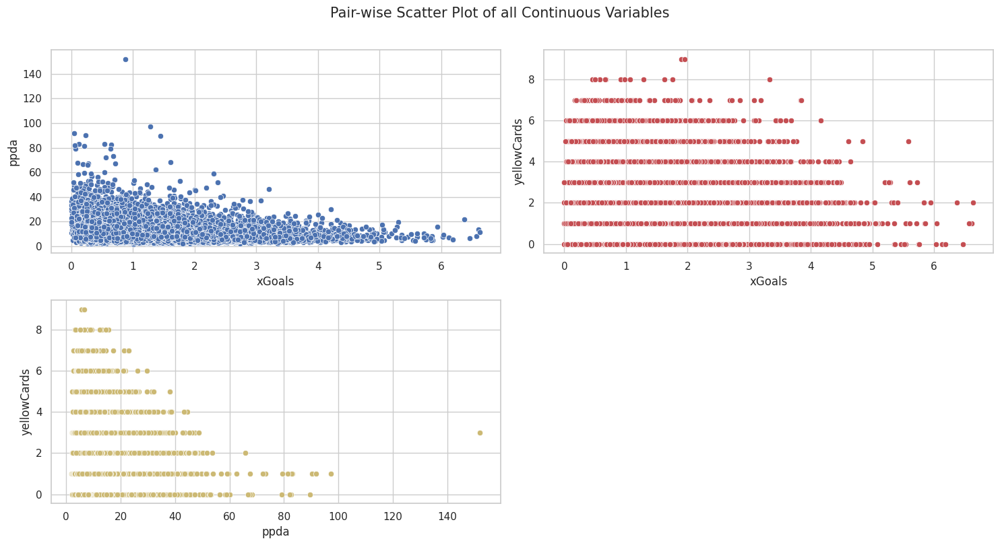

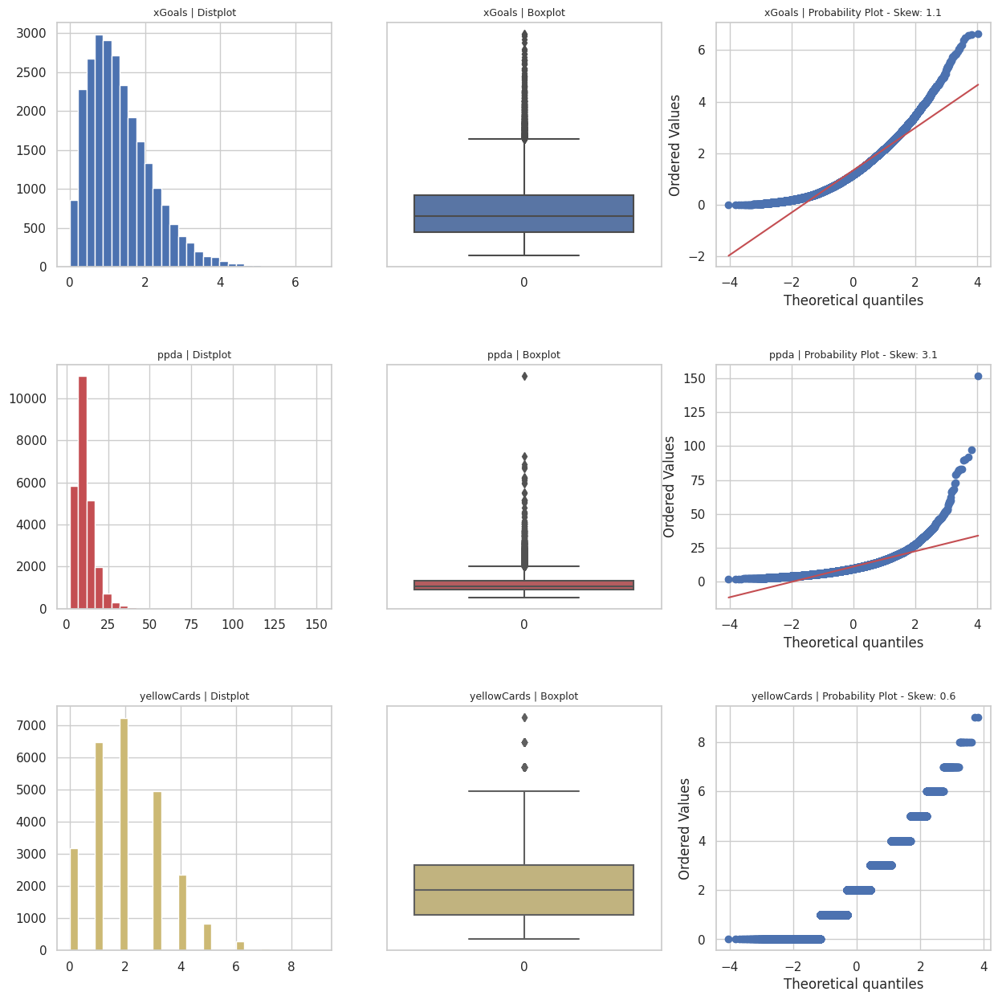

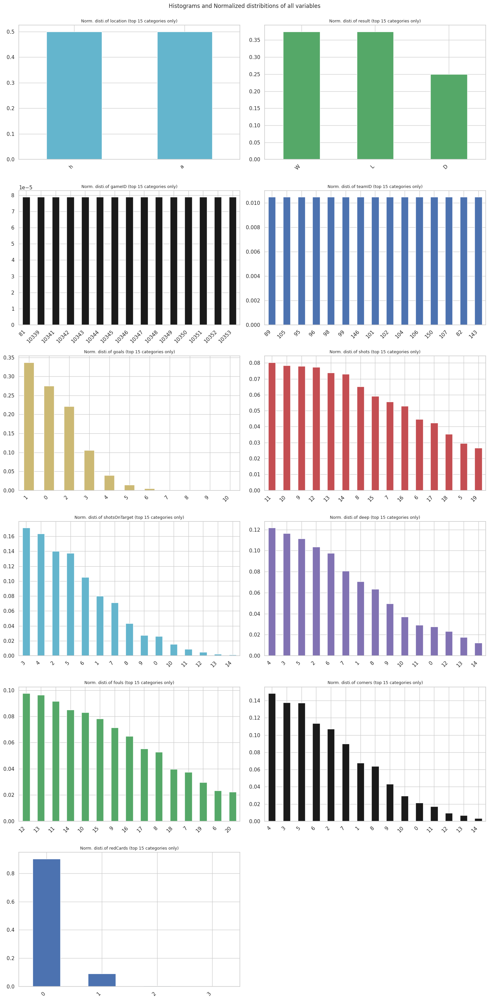

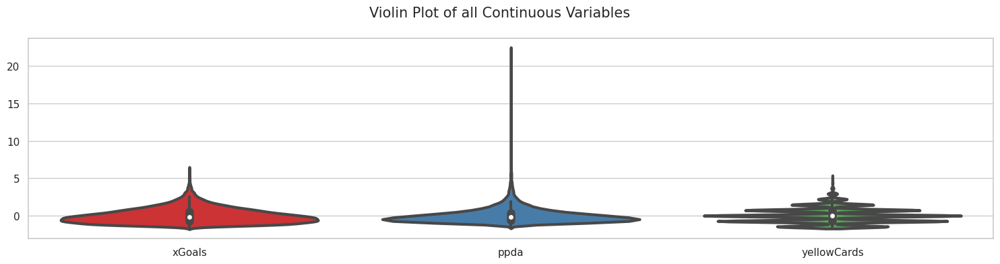

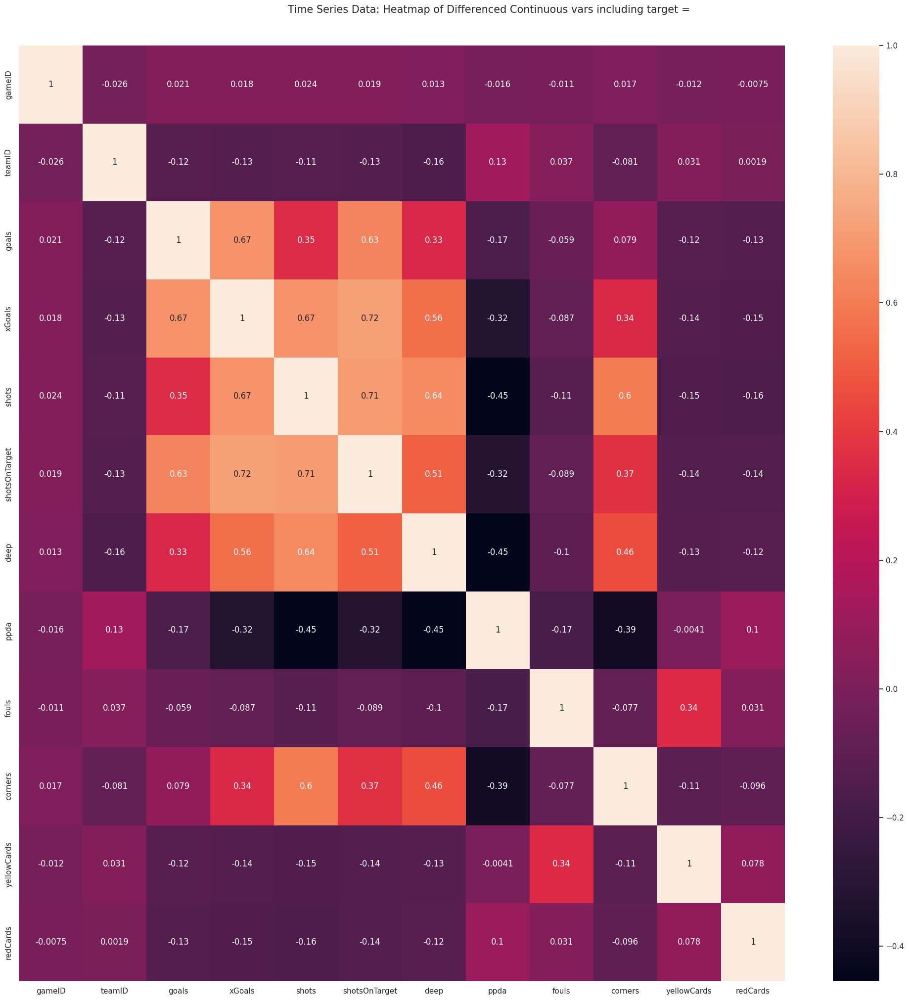

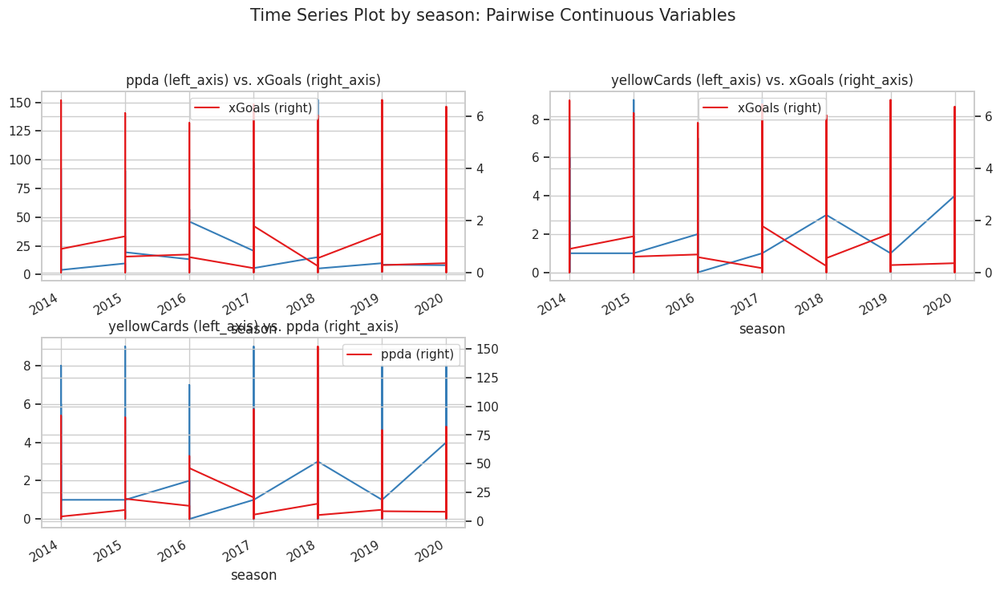

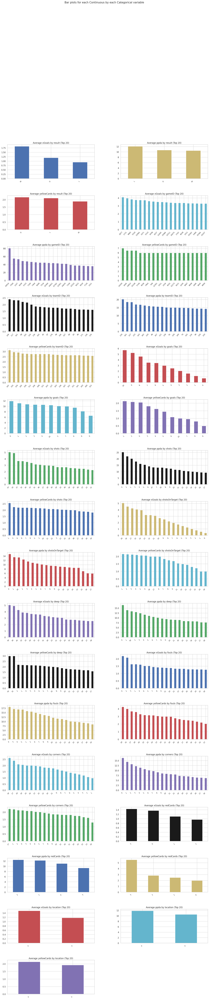

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package movie_reviews is a

Could not draw wordcloud plot for date
All Plots done
Time to run AutoViz = 20 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
=== Completed AutoViz on df_teamstats ===

=== Running AutoViz on df_shots ===
    max_rows_analyzed is smaller than dataset shape 324543...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 11)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  4
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Co

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,8,81.000000,16135.000000,No issue
shooterID,int64,0.000000,3,3.000000,9566.000000,Column has 2332 outliers greater than upper bound (8225.50) or lower than lower bound(-3578.50). Cap them or remove them.
assisterID,float64,26.037333,NA,1.000000,9526.000000,"39056 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 2133 outliers greater than upper bound (8127.00) or lower than lower bound(-3553.00). Cap them or remove them."
minute,int64,0.000000,0,0.000000,103.000000,No issue
situation,object,0.000000,0,,,No issue
lastAction,object,0.000000,0,,,24 rare categories: Too many to list. Group them into a single category or drop the categories.
shotType,object,0.000000,0,,,1 rare categories: ['OtherBodyPart']. Group them into a single category or drop the categories.
shotResult,object,0.000000,0,,,1 rare categories: ['OwnGoal']. Group them into a single category or drop the categories.
xGoal,float64,0.000000,NA,0.000000,0.979344,Column has 20996 outliers greater than upper bound (0.20) or lower than lower bound(-0.08). Cap them or remove them.
positionX,float64,0.000000,NA,0.004000,0.999000,Column has 867 outliers greater than upper bound (1.10) or lower than lower bound(0.59). Cap them or remove them.


Number of All Scatter Plots = 10


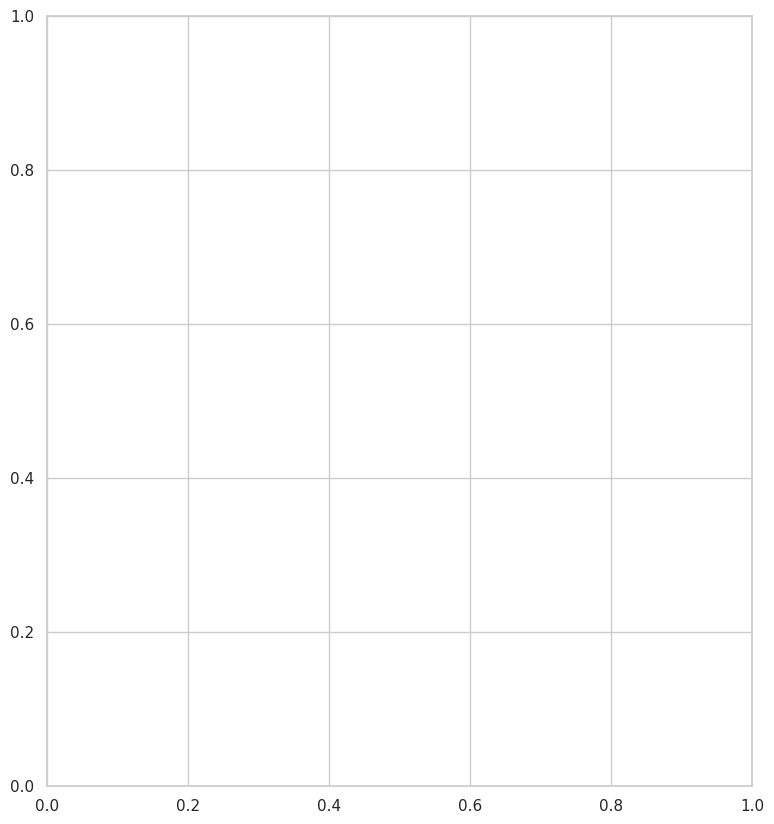

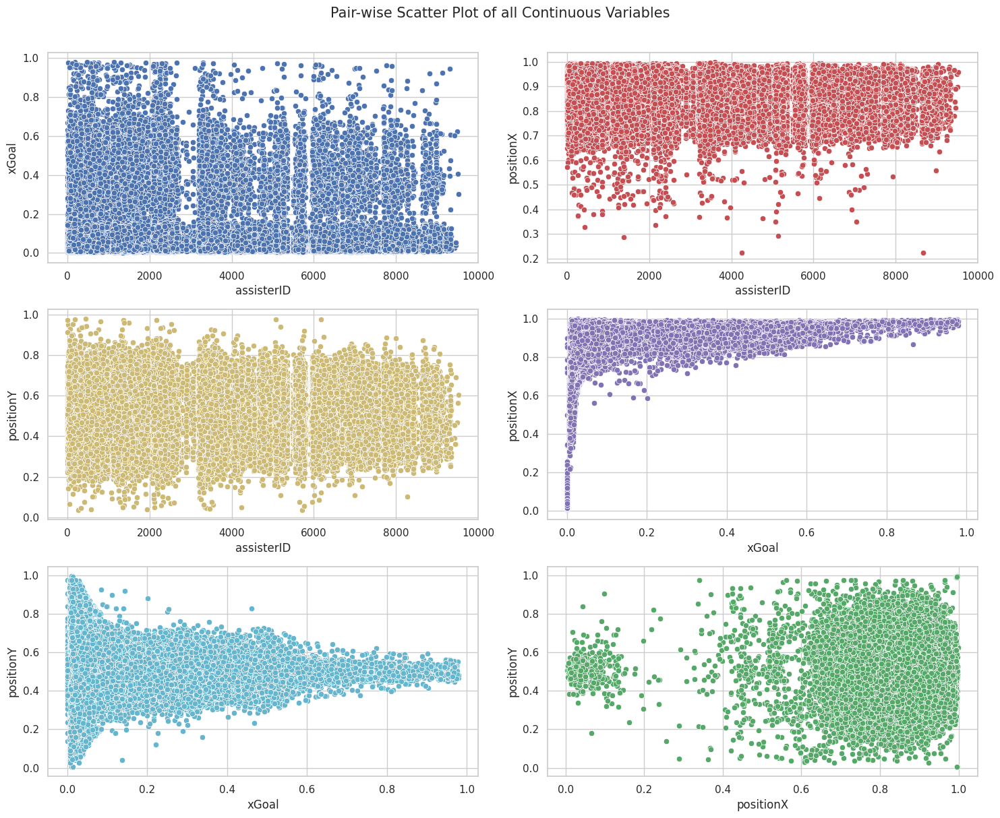

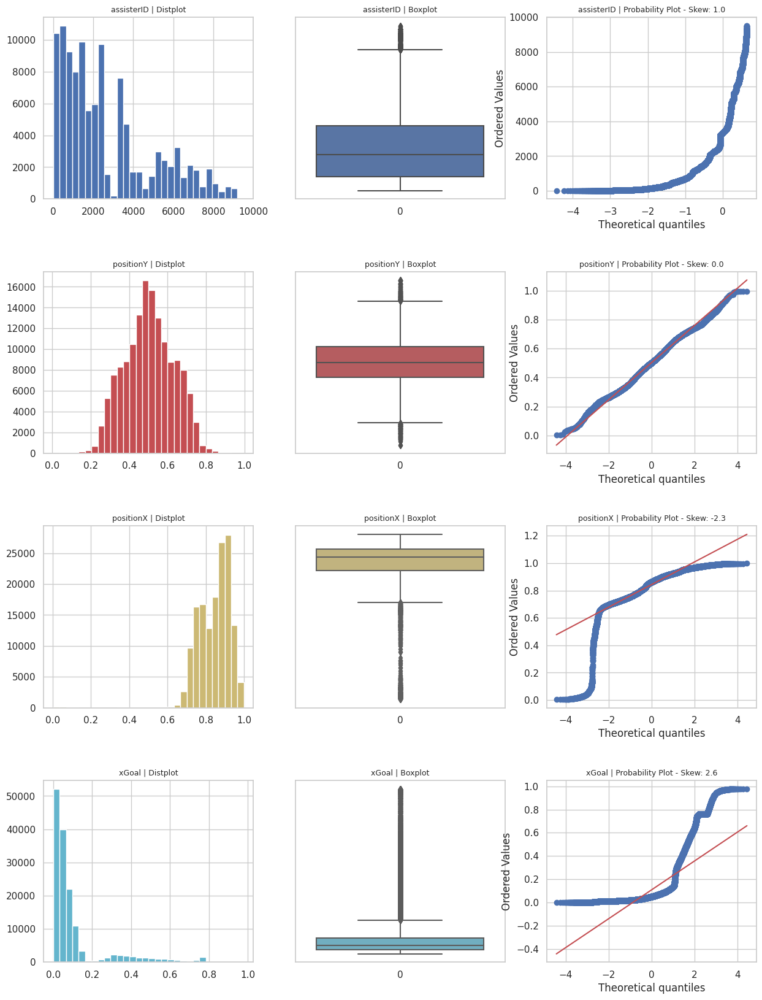

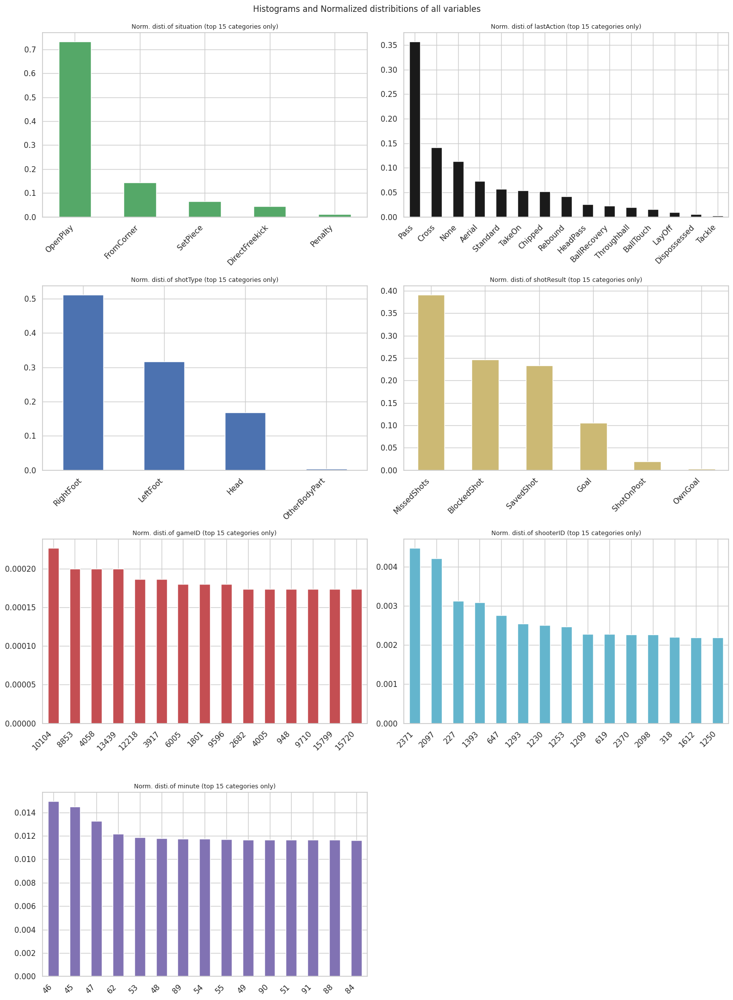

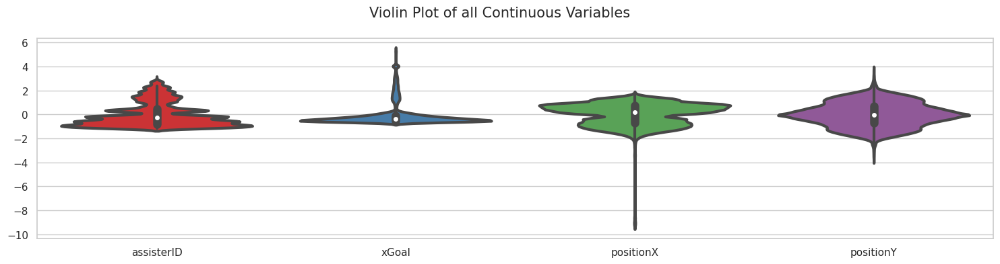

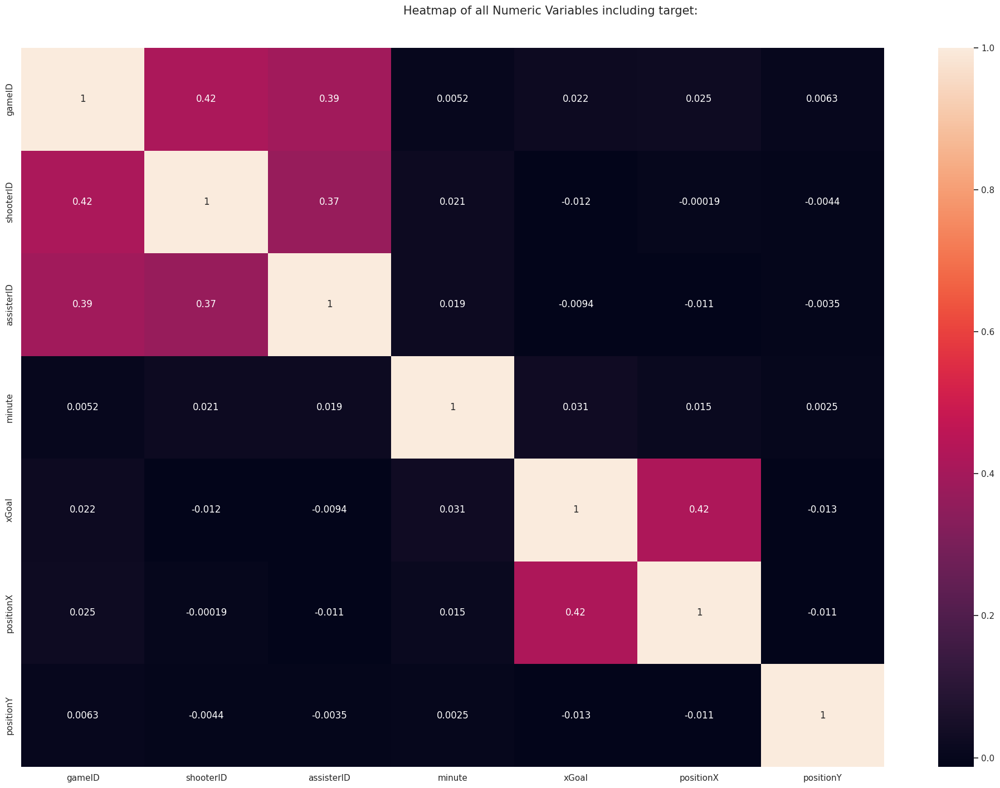

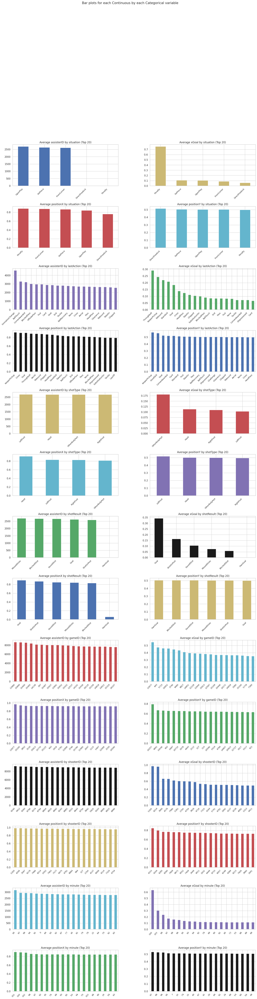

All Plots done
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
=== Completed AutoViz on df_shots ===

=== Running AutoViz on player_shots ===
    max_rows_analyzed is smaller than dataset shape 324543...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 11)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  4
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Col

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,8,81.000000,16135.000000,No issue
playerID,int64,0.000000,3,3.000000,9566.000000,Column has 2332 outliers greater than upper bound (8225.50) or lower than lower bound(-3578.50). Cap them or remove them.
assisterID,float64,26.037333,NA,1.000000,9526.000000,"39056 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 2133 outliers greater than upper bound (8127.00) or lower than lower bound(-3553.00). Cap them or remove them."
minute,int64,0.000000,0,0.000000,103.000000,No issue
situation,object,0.000000,0,,,No issue
lastAction,object,0.000000,0,,,24 rare categories: Too many to list. Group them into a single category or drop the categories.
shotType,object,0.000000,0,,,1 rare categories: ['OtherBodyPart']. Group them into a single category or drop the categories.
shotResult,object,0.000000,0,,,1 rare categories: ['OwnGoal']. Group them into a single category or drop the categories.
xGoal,float64,0.000000,NA,0.000000,0.979344,Column has 20996 outliers greater than upper bound (0.20) or lower than lower bound(-0.08). Cap them or remove them.
positionX,float64,0.000000,NA,0.004000,0.999000,Column has 867 outliers greater than upper bound (1.10) or lower than lower bound(0.59). Cap them or remove them.


Number of All Scatter Plots = 10


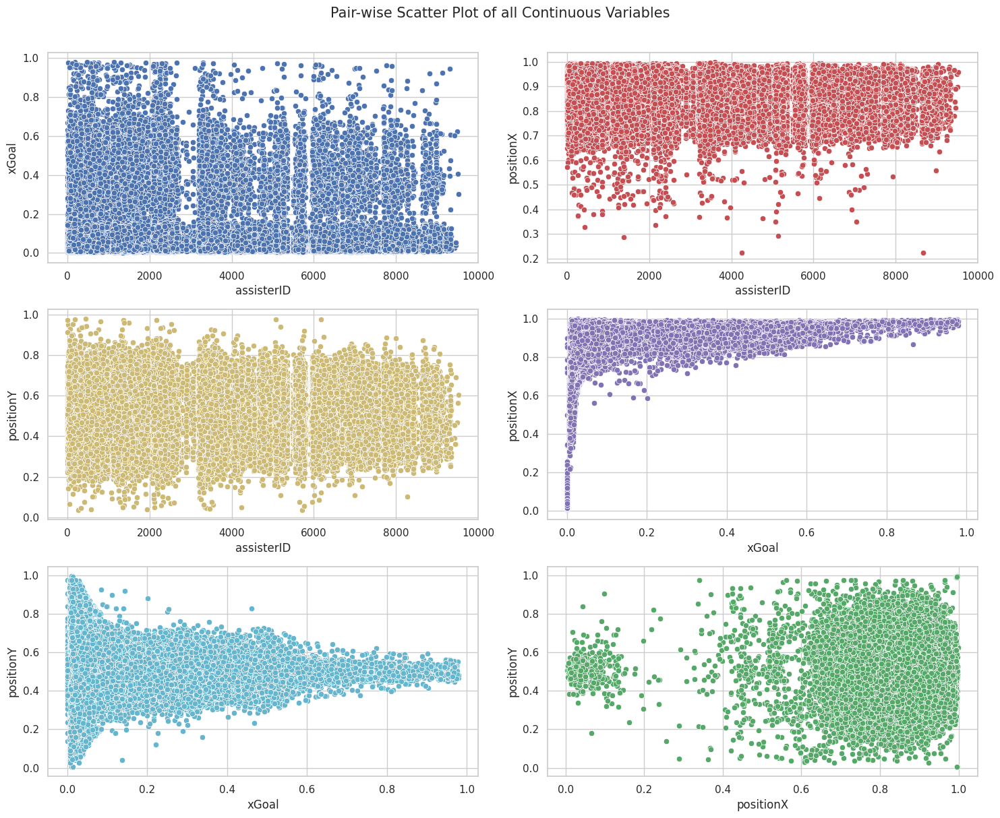

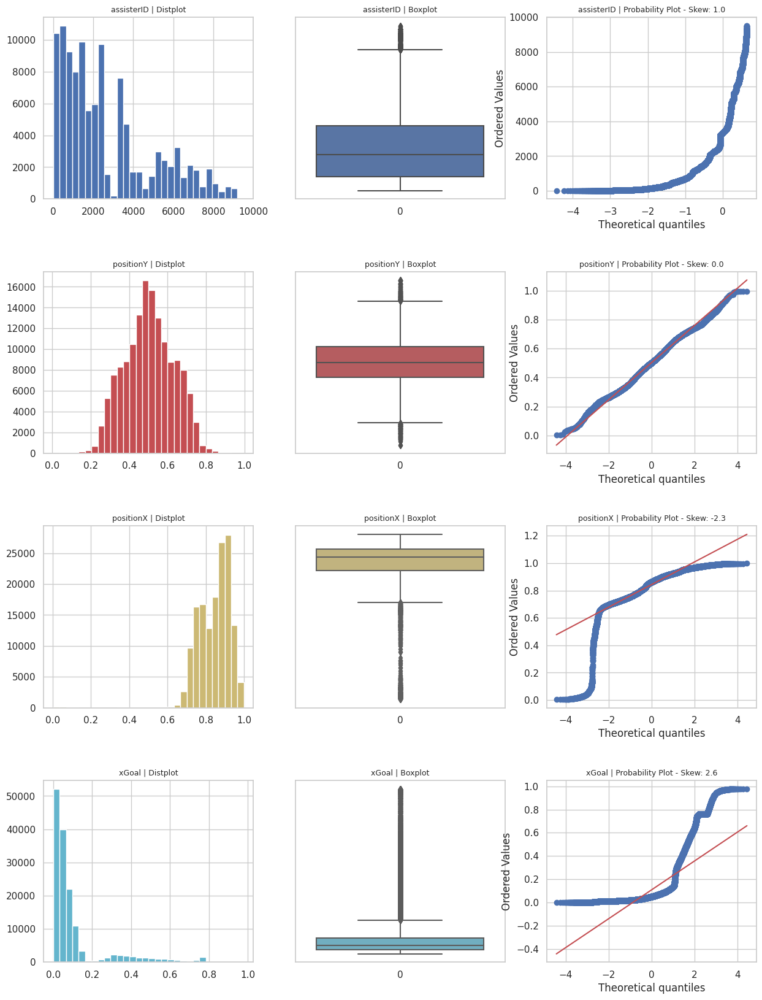

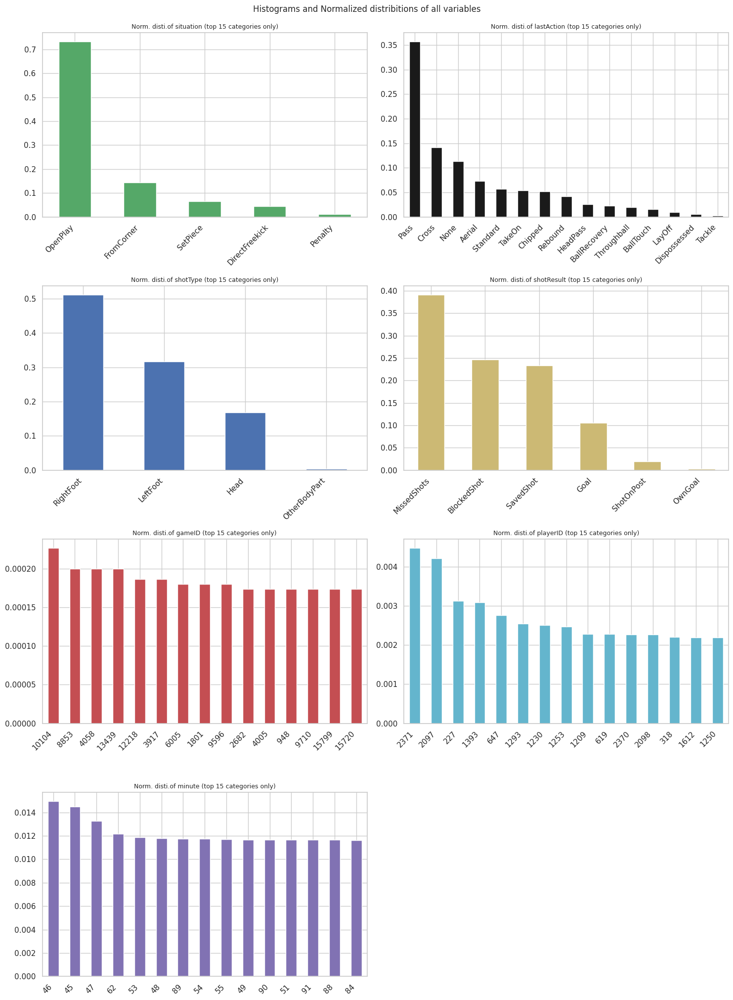

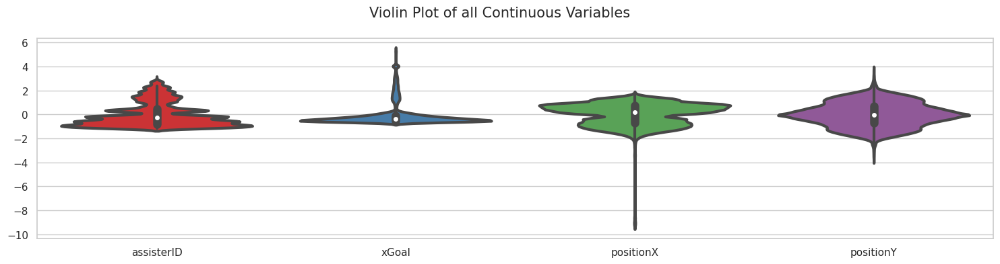

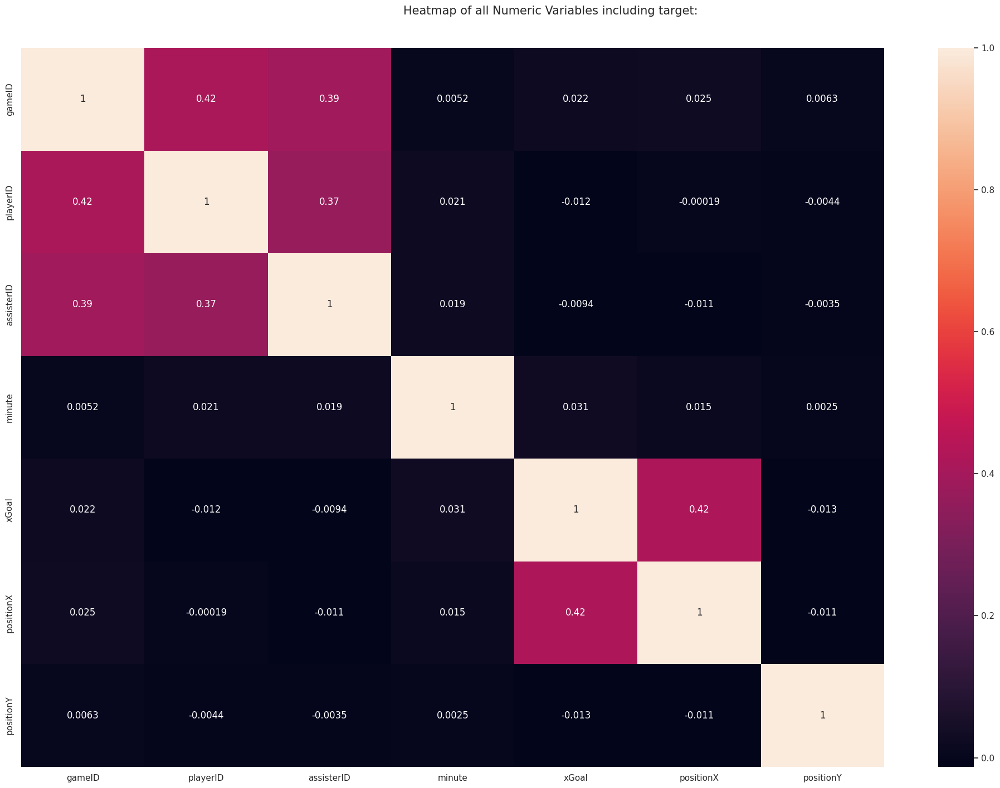

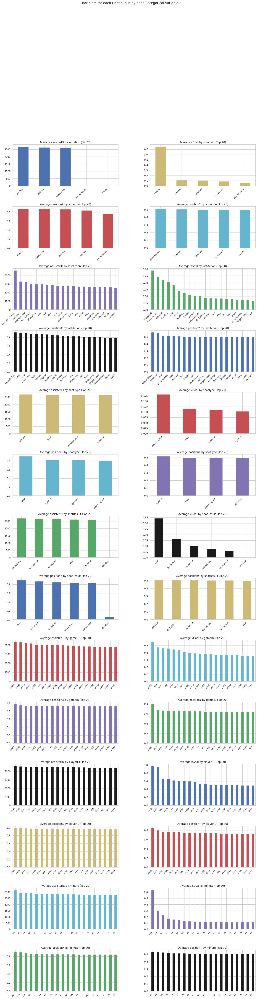

All Plots done
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
=== Completed AutoViz on player_shots ===

Skipping teamstats...
=== Running AutoViz on df_combined ===
Shape of your Data Set loaded: (12680, 39)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  21
    Number of String-Categorical Columns =  3
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  3
    Number of Date Time Columns =  3
    Number of ID Columns =  1
    Number of Co

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,100,81.000000,16135.000000,Possible ID column: drop before modeling step.
leagueID,int64,0.000000,0,1.000000,5.000000,No issue
season,int64,0.000000,0,2014.000000,2020.000000,Possible date-time colum: transform before modeling step.
date,object,0.000000,53,,,No issue
homeTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
awayTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
homeGoals,int64,0.000000,0,0.000000,10.000000,Column has 981 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
awayGoals,int64,0.000000,0,0.000000,9.000000,Column has 44 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
homeGoalsHalfTime,int64,0.000000,0,0.000000,6.000000,Column has 403 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
awayGoalsHalfTime,int64,0.000000,0,0.000000,5.000000,Column has 225 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.


Number of All Scatter Plots = 21


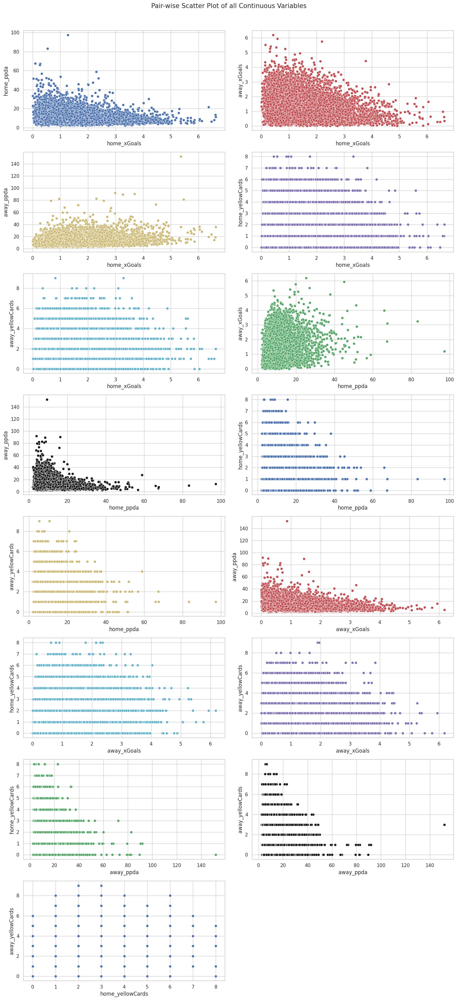

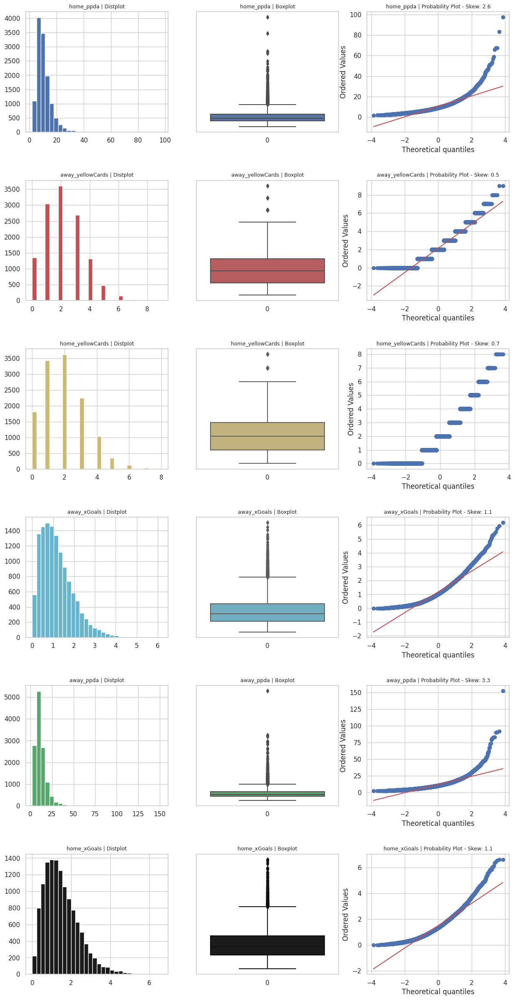

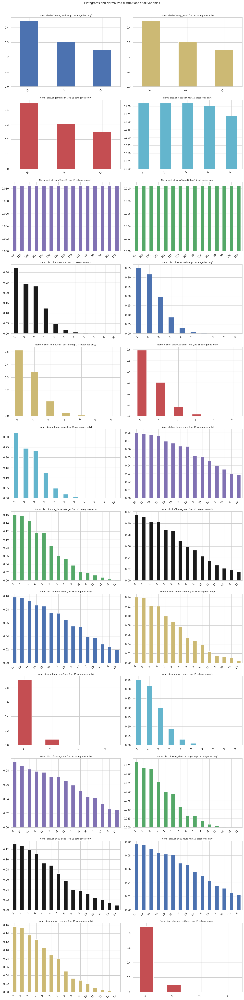

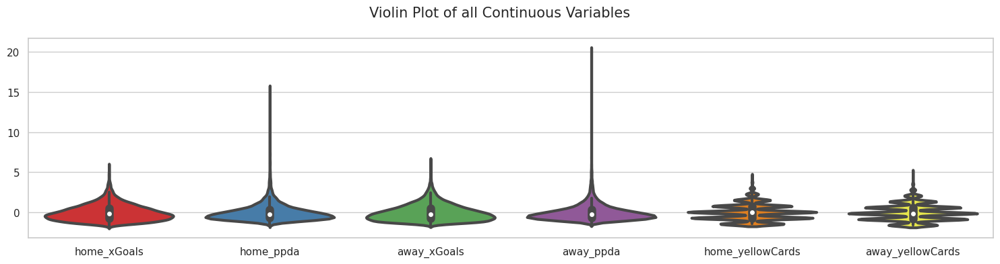

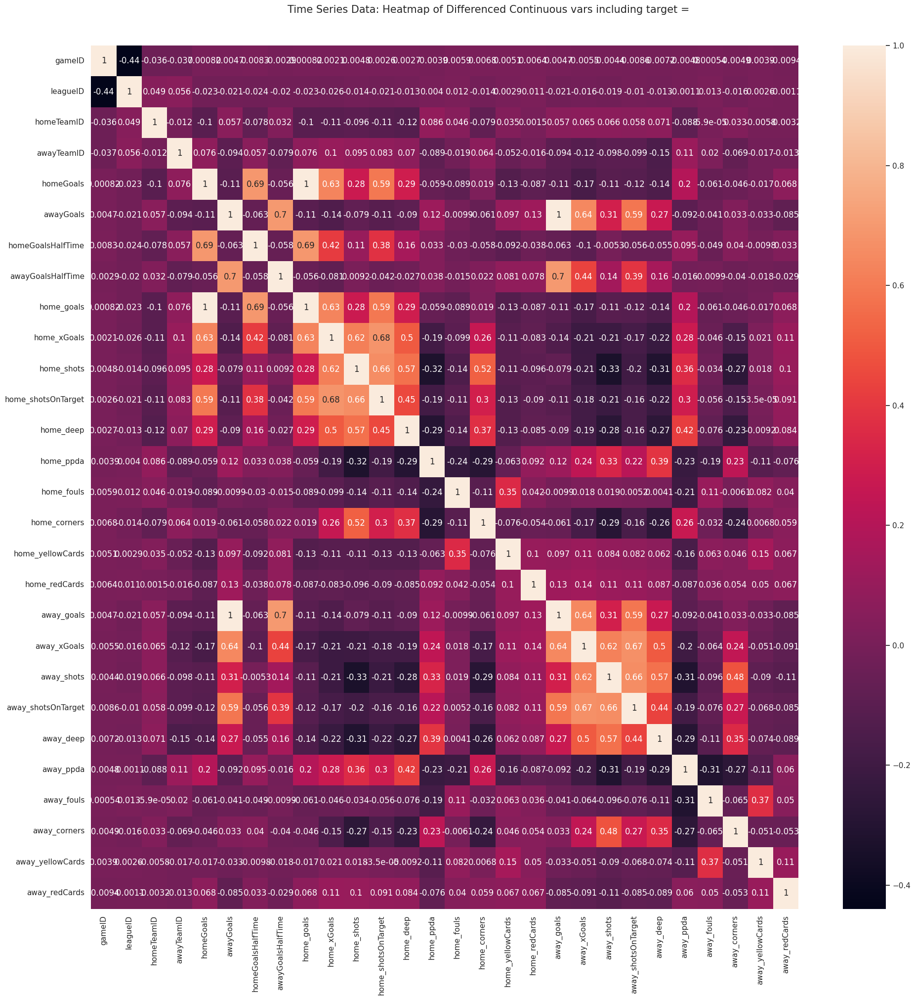

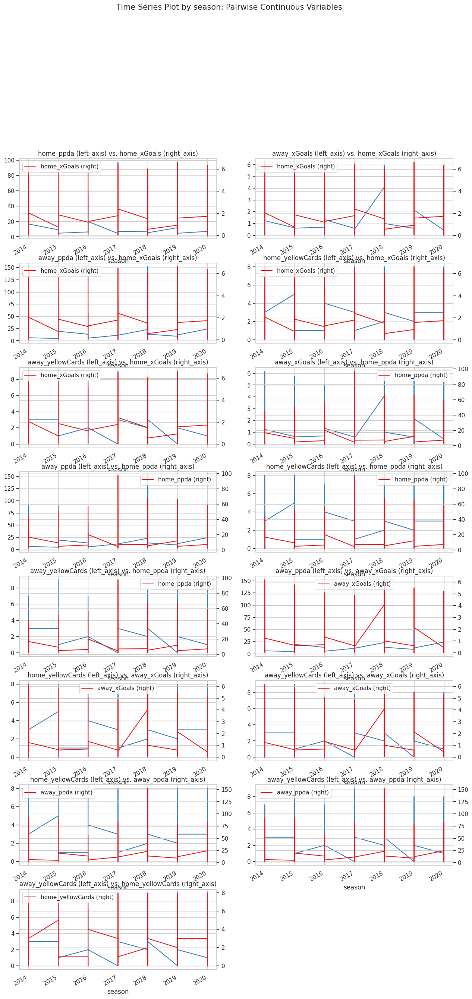

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package movie_reviews is a

Could not draw wordcloud plot for date
Could not draw wordcloud plot for home_date
Could not draw wordcloud plot for away_date
All Plots done
Time to run AutoViz = 54 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
=== Completed AutoViz on df_combined ===



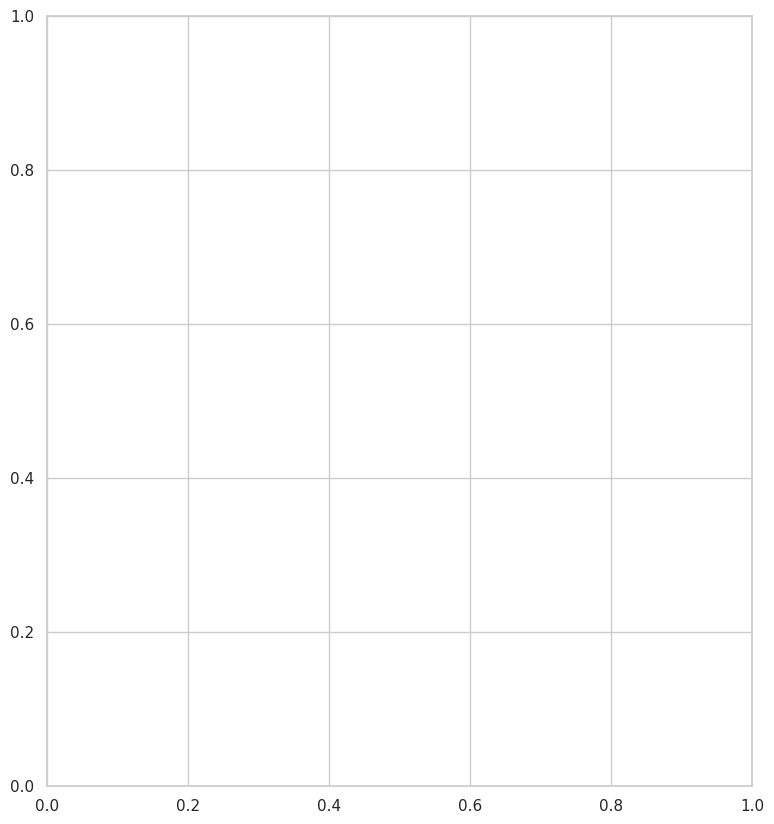

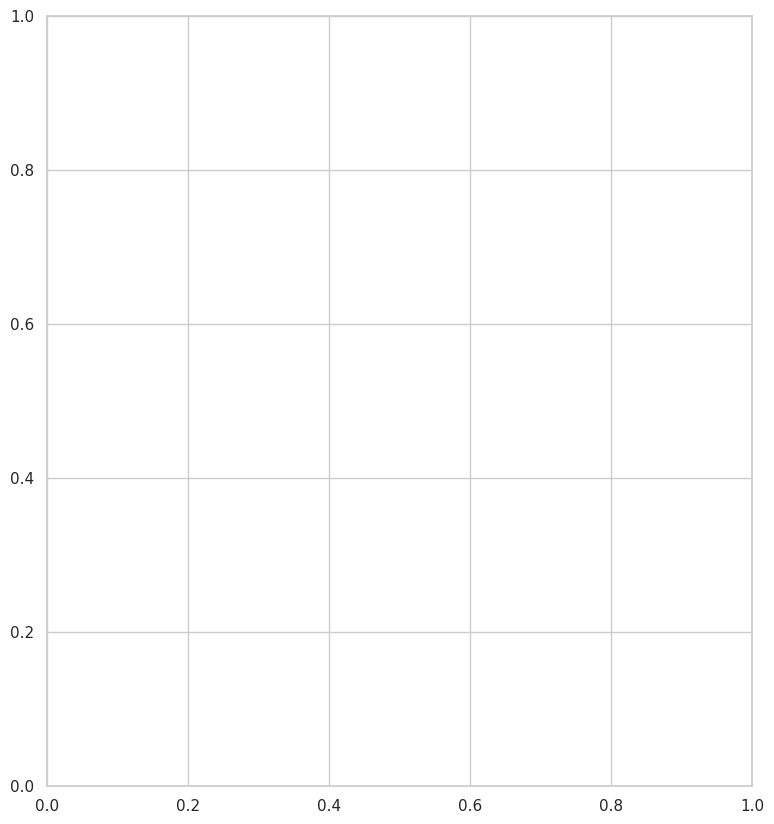

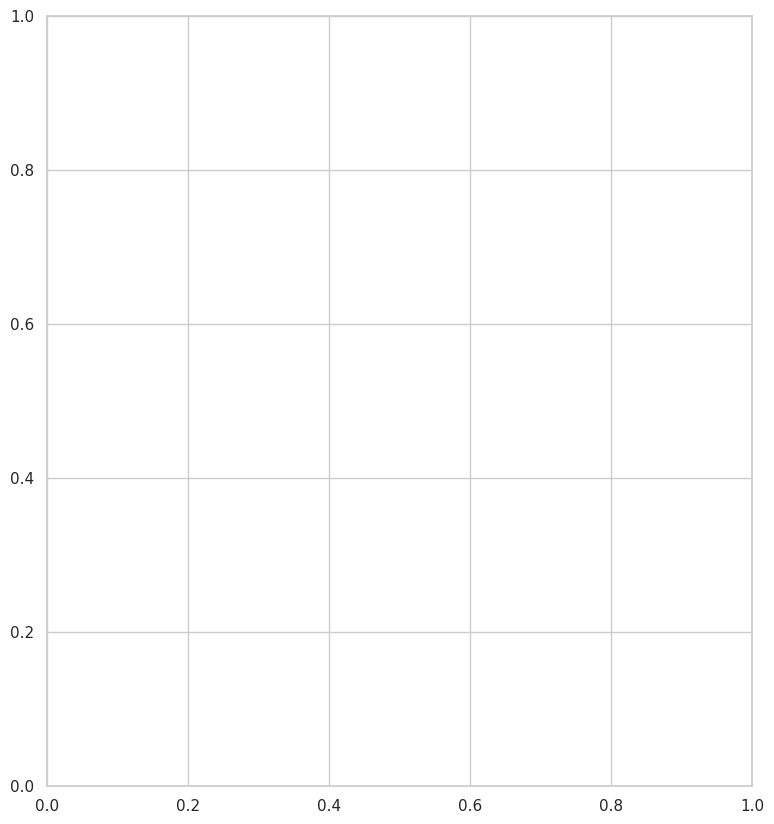

In [19]:
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
%matplotlib inline

AV = AutoViz_Class()

for name, df in dataframes.items():
    # Skip if df_name is in the excluded set
    if name == "teamstats":
        print(f"Skipping {name}...")
        continue
    
    print(f"=== Running AutoViz on {name} ===")
    
    # Save DataFrame to CSV
    csv_path = f"../csvs/{name}.csv"
    df.to_csv(csv_path, index=False)
    
    # Run AutoViz on the newly created CSV
    AV.AutoViz(csv_path)
    
    print(f"=== Completed AutoViz on {name} ===\n")